#### Name : Debprasad Kundu (Roll No CS2102)
#### Name : Kuntal Pramanick (Roll No CS2105)
#### Name : Pradip Das (Roll No CS2115)

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import glob

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
img = [cv2.imread(file) for file in glob.glob('/content/drive/MyDrive/Colab Notebooks/Eye/**/*.ppm',recursive=True)]

# Original image

In [5]:
fig = plt.figure(figsize=(70,40))
rows = 3
columns = 5
for i in range(len(img)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(img[i])
    plt.axis('off')

Output hidden; open in https://colab.research.google.com to view.

# Working on RGB Model

### Extract RGB plane

In [6]:
B, G, R = [], [], []
for item in img:
    b, g, r = cv2.split(item)
    R.append(r)
    G.append(g)
    B.append(b)

**R Channel**

In [7]:
fig = plt.figure(figsize=(70,40))
rows = 3
columns = 5
for i in range(len(R)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(R[i])
    plt.axis('off')

Output hidden; open in https://colab.research.google.com to view.

**G channel**

In [8]:
fig = plt.figure(figsize=(70,40))
rows = 3
columns = 5
for i in range(len(G)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(G[i])
    plt.axis('off')

Output hidden; open in https://colab.research.google.com to view.

**B Channel**

In [9]:
fig = plt.figure(figsize=(70,40))
rows = 3
columns = 5
for i in range(len(B)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(B[i])
    plt.axis('off')

Output hidden; open in https://colab.research.google.com to view.

***For enhance the extracted plane we blurred the red channel and sharpen green & blue chennel***

### Blurring Red channel

In [10]:
kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])

In [11]:
imgr = []
for item in R:
    imgr.append(cv2.GaussianBlur(item, (9,9),0))

In [12]:
fig = plt.figure(figsize=(70,40))
rows = 3
columns = 5
for i in range(len(imgr)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(imgr[i])
    plt.axis('off')

Output hidden; open in https://colab.research.google.com to view.

### Sharpening green channel

In [13]:
imgg = []
for item in G:
    imgg.append(cv2.filter2D(item, -1, kernel))    

In [14]:
fig = plt.figure(figsize=(70,40))
rows = 3
columns = 5
for i in range(len(imgg)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(imgg[i])
    plt.axis('off')

Output hidden; open in https://colab.research.google.com to view.

### Sharpening blue channel

In [15]:
imgb = []
for item in B:
    imgb.append(cv2.filter2D(item, -1, kernel)) 
    
fig = plt.figure(figsize=(70,40))
rows = 3
columns = 5
for i in range(len(imgg)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(imgg[i])
    plt.axis('off')

Output hidden; open in https://colab.research.google.com to view.

### Stack all three channels

In [16]:
final_img = []
for i in range(len(img)):
    final_img.append(np.dstack((imgb[i], imgg[i], imgr[i])))

fig = plt.figure(figsize=(70,40))
rows = 3
columns = 5
print('Blur Red channel, Sharp green and blue channel')
for i in range(len(final_img)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(final_img[i])
    plt.axis('off')

Output hidden; open in https://colab.research.google.com to view.

### Stack all red and blue channels

In [17]:
final_rbimg = []
for i in range(len(img)):
    final_rbimg.append(np.dstack((imgb[i], np.zeros(np.array(imgg[i]).shape), imgr[i])))

fig = plt.figure(figsize=(70,40))
rows = 3
columns = 5
for i in range(len(final_rbimg)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(final_rbimg[i])
    plt.axis('off')

Output hidden; open in https://colab.research.google.com to view.

### Stack red and green channels

In [18]:
final_rgimg = []
for i in range(len(img)):
    final_rgimg.append(np.dstack((np.zeros(np.array(imgb[i]).shape), imgg[i], imgr[i])))
    
fig = plt.figure(figsize=(70,40))
rows = 3
columns = 5
for i in range(len(final_rgimg)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(final_rgimg[i])
    plt.axis('off')

Output hidden; open in https://colab.research.google.com to view.

### Stack blue and green channels

In [19]:
final_bgimg = []
for i in range(len(img)):
    final_bgimg.append(np.dstack((imgb[i], imgg[i], np.zeros(np.array(imgb[i]).shape))))

fig = plt.figure(figsize=(70,40))
rows = 3
columns = 5
for i in range(len(final_bgimg)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(final_bgimg[i])
    plt.axis('off')

Output hidden; open in https://colab.research.google.com to view.

# Working on YCbCr Model

In [20]:
img_YCrCb=[]
for i in range(len(img)):
    img1 = cv2.cvtColor(img[i],cv2.COLOR_BGR2YCrCb)
    img_YCrCb.append(img1)

In [21]:
Y, Cr, Cb = [], [], []
for item in img:
    a, b, c = cv2.split(item)
    Y.append(a)
    Cr.append(b)
    Cb.append(c)

**Y Channel**

In [22]:
fig = plt.figure(figsize=(70,40))
rows = 3
columns = 5
for i in range(len(Y)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(Y[i])
    plt.axis('off')

Output hidden; open in https://colab.research.google.com to view.

**Cr Channel**

In [23]:
fig = plt.figure(figsize=(70,40))
rows = 3
columns = 5
for i in range(len(Cr)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(Cr[i])
    plt.axis('off')

Output hidden; open in https://colab.research.google.com to view.

**Cb Channel**

In [24]:
fig = plt.figure(figsize=(70,40))
rows = 3
columns = 5
for i in range(len(Cb)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(Cb[i])
    plt.axis('off')

Output hidden; open in https://colab.research.google.com to view.

***For enhance the extracted plane we blurred the Cb & Y channel and sharpen Cr chennel***

### Blurring Cb channel

In [25]:
imgCb = []
for item in Cb:
    imgCb.append(cv2.GaussianBlur(item, (11,11),0))
    
fig = plt.figure(figsize=(70,40))
rows = 3
columns = 5
for i in range(len(imgCb)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(imgCb[i])
    plt.axis('off')

Output hidden; open in https://colab.research.google.com to view.

### Sharpening Y channel

In [26]:
imgY_s = []
for item in Y:
    imgY_s.append(cv2.filter2D(item, -1, kernel)) 
    
fig = plt.figure(figsize=(70,40))
rows = 3
columns = 5
for i in range(len(imgY_s)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(imgY_s[i])
    plt.axis('off')

Output hidden; open in https://colab.research.google.com to view.

### Blurring Y channel

In [27]:
imgY_b = []
for item in Y:
    imgY_b.append(cv2.GaussianBlur(item, (5,5),0))
    
fig = plt.figure(figsize=(70,40))
rows = 3
columns = 5
for i in range(len(imgY_b)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(imgY_b[i])
    plt.axis('off')

Output hidden; open in https://colab.research.google.com to view.

### Sharpening Cr channel

In [28]:
imgCr = []
for item in Cr:
    imgCr.append(cv2.filter2D(item, -1, kernel)) 
    
fig = plt.figure(figsize=(70,40))
rows = 3
columns = 5
for i in range(len(imgCr)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(imgCr[i])
    plt.axis('off')

Output hidden; open in https://colab.research.google.com to view.

### Stack sharped Y & Cr and blurred Cb channels

In [29]:
final_YCrCbimg = []
for i in range(len(img)):
    final_YCrCbimg.append(np.dstack((imgY_s[i], imgCr[i], imgCb[i])))

fig = plt.figure(figsize=(70,40))
rows = 3
columns = 5
for i in range(len(final_YCrCbimg)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(final_YCrCbimg[i])
    plt.axis('off')

Output hidden; open in https://colab.research.google.com to view.

### Stack sharped Cr and blurred Y & Cb channels

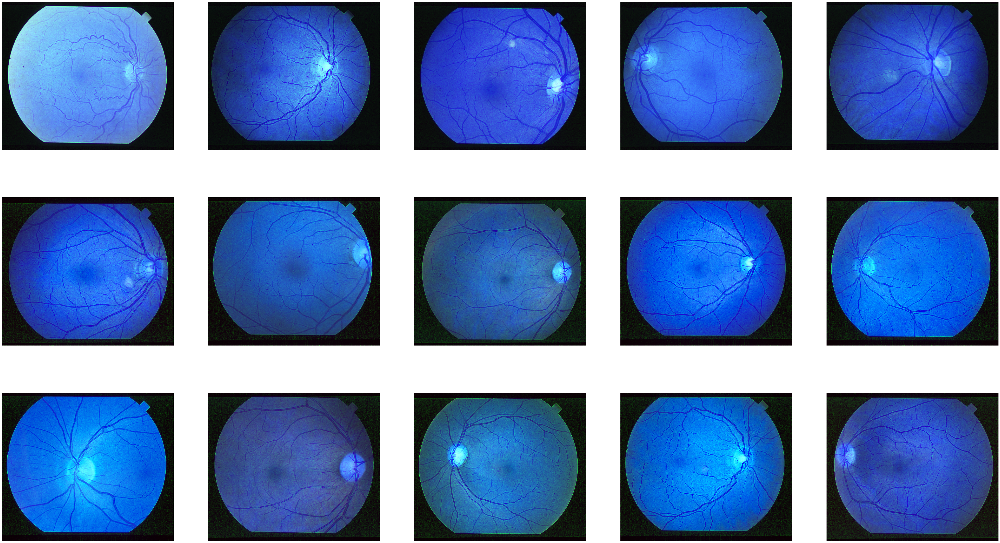

In [30]:
final_YCrCbimg1 = []
for i in range(len(img)):
    final_YCrCbimg1.append(np.dstack((imgY_b[i], imgCr[i], imgCb[i])))

fig = plt.figure(figsize=(70,40))
rows = 3
columns = 5
for i in range(len(final_YCrCbimg1)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(final_YCrCbimg1[i])
    plt.axis('off')

# Comment

For RGB color model we get good result **when we Blur Red channel, Sharp green and blue channel and stack all of them together**.

For YCbCr color model we get good result in the following cases
1. **when we sharped Y & Cr and blurred Cb channels and stack all of them together** 
2. **when we sharped Cr and blurred Y & Cb channels stack all of them together**